In [1]:
import os

import IPython.display as ipd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn as skl
import sklearn.utils, sklearn.preprocessing, sklearn.decomposition, sklearn.svm
import librosa
import librosa.display

import utils
plt.rcParams['figure.figsize'] = (13, 5)

from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.feature_selection import VarianceThreshold
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score, classification_report
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.metrics import confusion_matrix
import itertools
from sklearn.model_selection import RandomizedSearchCV
from imblearn.under_sampling import RandomUnderSampler
from imblearn.under_sampling import CondensedNearestNeighbour
from collections import Counter
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_auc_score
from scipy import interp
from itertools import cycle
from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain
from scikitplot.metrics import plot_lift_curve
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import StandardScaler
from scipy.spatial.distance import pdist, squareform
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.neighbors import LocalOutlierFactor
from sklearn.ensemble import IsolationForest
from pyod.models.abod import ABOD
from sklearn.decomposition import PCA
from matplotlib.colors import ListedColormap


In [2]:
features = pd.read_csv('data/fma_metadata/df_analisi.csv',index_col=[0], header=[0,1,2])

features

feature    chroma_stft       mfcc                                    \
statistics        mean        max                                     
number              01         01         03          04         07   
track_id                                                              
2             0.696063  28.657707  52.424423  103.289833  37.843021   
3             0.449602  29.380682  76.742714  137.245010  55.662521   
5             0.481160 -40.500740  50.373932  112.312531  29.266182   
10            0.388109  20.196968  60.412815   78.466721  21.597277   
134           0.438062 -41.723225  58.687328  125.922821  37.450359   
...                ...        ...        ...         ...        ...   
155297        0.408626   3.826046  94.208336   48.085751  26.723190   
155298        0.439034 -72.790154  81.013275  124.569000  29.571426   
155306        0.369401  -7.814734  88.024063  116.180260  29.388819   
155307        0.357939 -13.889938  62.219879   93.028778  41.311356   
155314        0.551894 -15.305521  32.737503   95.054657  25.620636   

feature                                                                ...  \
statistics                   mean           min                        ...   
number             11          02            02         04         05  ...   
track_id                                                               ...   
2           27.737400  116.696678 -1.421085e-14 -51.569004 -97.879890  ...   
3           26.740063  120.158501 -1.851665e+01 -12.548506 -87.048355  ...   
5           27.197964  132.215073 -6.228398e+01 -24.319845 -74.060310  ...   
10          24.780317  157.040085  5.151435e-14 -50.578659 -45.113949  ...   
134         36.486378  125.521309 -9.427860e-01 -90.334747 -67.671829  ...   
...               ...         ...           ...        ...        ...  ...   
155297      19.866936  163.954620 -1.776357e-14 -29.221125 -28.104187  ...   
155298      38.472843  160.770218 -7.993606e-14  -7.314378 -69.236115  ...   
155306      47.185654  177.614151  5.329071e-15 -49.451691 -70.841232  ...   
155307      33.690544  124.228142 -5.892177e+00 -50.547176 -99.119080  ...   
155314      34.402496  166.692734 -2.464827e-01 -55.172737 -55.477066  ...   

feature                          spectral_bandwidth spectral_contrast  \
statistics        std                      kurtosis               max   
number             02         04                 01                03   
track_id                                                                
2           38.569584  20.767921           3.874384         39.333603   
3           41.191982  22.025253           2.383340         42.141411   
5           39.367599  24.319347           0.895442         39.017235   
10          44.409843  14.013119           0.437628         45.410881   
134         47.266518  36.841534           0.372903         41.526760   
...               ...        ...                ...               ...   
155297      30.287067  12.060067          20.706787         40.720093   
155298      39.359367  18.604885           5.868375         39.627396   
155306      40.537926  28.671246           4.375974         40.628235   
155307      35.382370  22.123117          -0.383395         48.715477   
155314      26.786989  22.369673           0.011010         39.460281   

feature                           tonnetz metadata                              
statistics                  min       std      set         track                
number             04        02        01   subset     genre_top genre_top_Cat  
track_id                                                                        
2           31.513493  2.296826  0.019809    small       Hip-Hop             7  
3           31.473713  0.652681  0.026316   medium       Hip-Hop             7  
5           33.707951  2.314010  0.025550    small       Hip-Hop             7  
10          28.711344  4.415900  0.021413    small           Pop            12  
134         32.2243

In [3]:
features['metadata','track','genre_top'].value_counts()

Rock                   7103
Electronic             6314
Experimental           2251
Hip-Hop                2201
Folk                   1519
Instrumental           1350
Pop                    1186
International          1018
Classical               619
Old-Time / Historic     510
Jazz                    384
Country                 178
Soul-RnB                154
Spoken                  118
Blues                    74
Easy Listening           21
Name: (metadata, track, genre_top), dtype: int64

In [4]:
attributes = [col for col in features.columns if (col != ('metadata','track','genre_top') and 
                                                  col != ('metadata','set','subset')  and
                                                 col != ('metadata','track','genre_top_Cat'))] 

X = features[attributes].values
y = features[('metadata','track','genre_top')]

df_SOLO_FEATURES=features.drop([('metadata','track','genre_top'),('metadata','set','subset'),('metadata','track','genre_top_Cat')], axis = 1)
df_SOLO_FEATURES.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25000 entries, 2 to 155314
Data columns (total 20 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   (chroma_stft, mean, 01)             25000 non-null  float64
 1   (mfcc, max, 01)                     25000 non-null  float64
 2   (mfcc, max, 03)                     25000 non-null  float64
 3   (mfcc, max, 04)                     25000 non-null  float64
 4   (mfcc, max, 07)                     25000 non-null  float64
 5   (mfcc, max, 11)                     25000 non-null  float64
 6   (mfcc, mean, 02)                    25000 non-null  float64
 7   (mfcc, min, 02)                     25000 non-null  float64
 8   (mfcc, min, 04)                     25000 non-null  float64
 9   (mfcc, min, 05)                     25000 non-null  float64
 10  (mfcc, min, 11)                     25000 non-null  float64
 11  (mfcc, skew, 04)                    2500

In [5]:
scaler = StandardScaler()
scaler.fit(X)

X = scaler.transform(X)
X

array([[ 1.86401457,  0.6150445 , -0.81877701, ..., -0.92131634,
        -0.63091256, -1.32208865],
       [-0.10348244,  0.62406228, -0.01565505, ..., -0.92921645,
        -1.94893681, -0.46633816],
       [ 0.14844478, -0.24758031, -0.88649537, ..., -0.48550455,
        -0.61713665, -0.56706532],
       ...,
       [-0.74373272,  0.16011768,  0.35691634, ..., -0.16975495,
        -0.29982352,  1.32080363],
       [-0.83523021,  0.08434064, -0.49527789, ...,  0.0099262 ,
        -0.49073173,  0.70909713],
       [ 0.71311626,  0.06668385, -1.46894598, ..., -0.90788814,
        -0.20152869, -0.32983617]])

In [6]:
df_features = pd.DataFrame(X,columns=df_SOLO_FEATURES.columns, index=df_SOLO_FEATURES.index)
df_features[('metadata','track','genre_top')]=y
df_features.head()

feature    chroma_stft      mfcc                                          \
statistics        mean       max                                           
number              01        01        03        04        07        11   
track_id                                                                   
2             1.864015  0.615044 -0.818777  0.213081 -0.096828 -0.476763   
3            -0.103482  0.624062 -0.015655  1.446340  1.204416 -0.573946   
5             0.148445 -0.247580 -0.886495  0.540787 -0.723140 -0.529327   
10           -0.594383  0.509512 -0.554957 -0.688499 -1.283151 -0.764907   
134          -0.195610 -0.262829 -0.611942  1.035116 -0.125502  0.375753   

feature                                             ...                      \
statistics      mean       min                      ...      skew       std   
number            02        02        04        05  ...        04        01   
track_id                                            ...                       
2          -0.902046  0.469769 -0.305931 -2.115932  ...  0.444004  0.622077   
3          -0.793508 -0.160231  1.279239 -1.553918  ...  0.333143  1.210474   
5          -0.415501 -1.649346  0.801040 -0.880009  ...  0.203958  0.505090   
10          0.362832  0.469769 -0.265699  0.621925  ... -0.511909  0.831299   
134        -0.625369  0.437693 -1.880751 -0.548531  ... -0.381898  0.832834   

feature                        spectral_bandwidth spectral_contrast            \
statistics                               kurtosis               max             
number            02        04                 01                03        04   
track_id                                                                        
2           0.127778  0.148286          -0.114547         -0.721109 -0.921316   
3           0.377015  0.358945          -0.173787         -0.148690 -0.929216   
5           0.203623  0.743308          -0.232903         -0.785605 -0.485505   
10          0.682846 -0.983444          -0.251092          0.517845 -1.477813   
134         0.954349  2.841332          -0.253663         -0.273997 -0.780149   

feature                tonnetz  metadata  
statistics       min       std     track  
number            02        01 genre_top  
track_id                                  
2          -0.630913 -1.322089   Hip-Hop  
3          -1.948937 -0.466338   Hip-Hop  
5          -0.617137 -0.567065   Hip-Hop  
10          1.067838 -1.111215       Pop  
134        -1.453616 -0.736969   Hip-Hop  

[5 rows x 21 columns]

## Isolation Forest

In [7]:
df=df_features.copy()

In [8]:
clf = IsolationForest(random_state=0,contamination=0.01)
clf.fit(X)

IsolationForest(contamination=0.01, random_state=0)

In [9]:
outliers = clf.predict(X)

In [10]:
np.unique(outliers, return_counts=True)

(array([-1,  1]), array([  250, 24750], dtype=int64))

In [11]:
def condition(x): return x == -1
output = [idx for idx, element in enumerate(outliers) if condition(element)]

In [12]:
print(output)

[193, 229, 371, 489, 493, 1096, 1176, 1374, 1430, 1433, 1468, 1471, 1573, 1680, 2099, 2706, 2745, 2753, 2757, 2760, 2765, 2767, 2768, 2769, 2770, 2775, 2777, 2784, 2792, 2814, 2815, 2821, 2967, 3065, 3068, 3070, 3072, 3074, 3079, 3081, 3083, 3084, 3092, 3094, 3096, 3097, 3098, 3102, 3103, 3104, 3105, 3106, 3184, 3192, 3314, 3320, 3322, 3327, 3333, 3336, 3339, 3340, 3342, 3343, 3344, 3456, 3457, 3460, 3462, 3463, 3469, 3479, 3563, 3565, 3606, 3608, 3609, 3648, 3802, 3803, 3884, 3943, 4120, 4121, 4123, 4124, 4125, 4126, 4127, 4131, 4145, 4147, 4148, 4149, 4150, 4152, 4203, 4209, 4252, 4254, 4278, 4284, 4285, 4286, 4287, 4288, 4289, 4327, 4499, 4740, 5044, 5434, 5540, 5670, 5675, 5691, 5847, 5850, 5894, 5897, 6100, 6246, 6299, 6408, 6519, 6778, 6782, 7483, 7660, 7962, 8138, 8141, 8305, 8306, 8605, 8606, 8724, 9121, 9125, 9205, 9285, 9288, 9442, 9486, 9491, 9580, 9583, 9637, 9638, 9912, 10603, 10607, 11134, 11242, 11425, 12067, 12201, 12353, 12354, 12673, 12749, 12752, 12917, 12920, 12921,

In [13]:
df_outliers=df.iloc[output]

In [14]:
df_outliers['metadata','track','genre_top'].value_counts()

Old-Time / Historic    87
Electronic             62
Experimental           59
International          17
Instrumental           11
Rock                    6
Hip-Hop                 3
Classical               2
Pop                     1
Spoken                  1
Folk                    1
Name: (metadata, track, genre_top), dtype: int64

In [15]:
df['metadata','track','genre_top'].value_counts()

Rock                   7103
Electronic             6314
Experimental           2251
Hip-Hop                2201
Folk                   1519
Instrumental           1350
Pop                    1186
International          1018
Classical               619
Old-Time / Historic     510
Jazz                    384
Country                 178
Soul-RnB                154
Spoken                  118
Blues                    74
Easy Listening           21
Name: (metadata, track, genre_top), dtype: int64

In [16]:
np.zeros(25000)

array([0., 0., 0., ..., 0., 0., 0.])

In [17]:
df['isol_Forest']=np.zeros(25000)
    

In [18]:
for i in output:
    df.iat[i,21]=1    
    print(i)

193
229
371
489
493
1096
1176
1374
1430
1433
1468
1471
1573
1680
2099
2706
2745
2753
2757
2760
2765
2767
2768
2769
2770
2775
2777
2784
2792
2814
2815
2821
2967
3065
3068
3070
3072
3074
3079
3081
3083
3084
3092
3094
3096
3097
3098
3102
3103
3104
3105
3106
3184
3192
3314
3320
3322
3327
3333
3336
3339
3340
3342
3343
3344
3456
3457
3460
3462
3463
3469
3479
3563
3565
3606
3608
3609
3648
3802
3803
3884
3943
4120
4121
4123
4124
4125
4126
4127
4131
4145
4147
4148
4149
4150
4152
4203
4209
4252
4254
4278
4284
4285
4286
4287
4288
4289
4327
4499
4740
5044
5434
5540
5670
5675
5691
5847
5850
5894
5897
6100
6246
6299
6408
6519
6778
6782
7483
7660
7962
8138
8141
8305
8306
8605
8606
8724
9121
9125
9205
9285
9288
9442
9486
9491
9580
9583
9637
9638
9912
10603
10607
11134
11242
11425
12067
12201
12353
12354
12673
12749
12752
12917
12920
12921
12929
13206
13267
13269
13382
13384
13549
13696
13699
14170
14236
14448
14763
14818
14820
14963
14973
15382
15738
16089
16232
16371
16375
16643
17316
17400
17462
174

In [22]:
aaa=df['isol_Forest'].copy()

In [19]:
df['isol_Forest'].iloc[1096]

1.0

In [20]:
pca = PCA(n_components=2)
pca.fit(X)
X_pca = pca.transform(X)

In [68]:
SMALL_SIZE = 30
MEDIUM_SIZE = 40
BIGGER_SIZE = 40

plt.rc('font', size=25)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=40)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=20)    # fontsize of the tick labels
plt.rc('ytick', labelsize=20)   # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title
plt.figure(figsize=(20, 12))

<Figure size 1440x864 with 0 Axes>

<Figure size 1440x864 with 0 Axes>

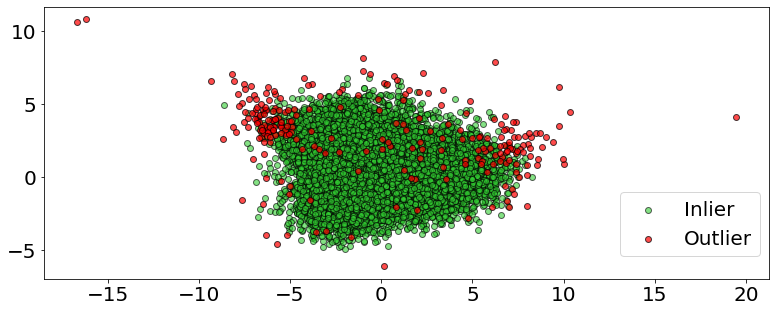

In [69]:
plt.scatter(X_pca[df['isol_Forest']==0][:,0],X_pca[df['isol_Forest']==0][:,1],c='limegreen',label='Inlier',alpha=0.6,edgecolor='k')
plt.scatter(X_pca[df['isol_Forest']==1][:,0],X_pca[df['isol_Forest']==1][:,1],c='red',label='Outlier',alpha=0.7,edgecolor='k')

plt.legend(loc='center left', prop=dict(size=20),bbox_to_anchor=(0.78, 0.2))
plt.show()

In [65]:
df['isol_Forest']==1

track_id
2         False
3         False
5         False
10        False
134       False
          ...  
155297    False
155298    False
155306    False
155307    False
155314    False
Name: isol_Forest, Length: 25000, dtype: bool

In [26]:
a[:,0]

ValueError: Can only tuple-index with a MultiIndex

In [21]:
label = aaa

NameError: name 'aaa' is not defined

In [141]:
X_pca

array([[ 0.97957282, -2.08224717],
       [ 2.06196915, -1.6480201 ],
       [ 0.72288593, -1.17856361],
       ...,
       [ 0.95343357,  0.56671508],
       [ 0.78562746,  0.4595302 ],
       [-1.31531136, -1.58304453]])

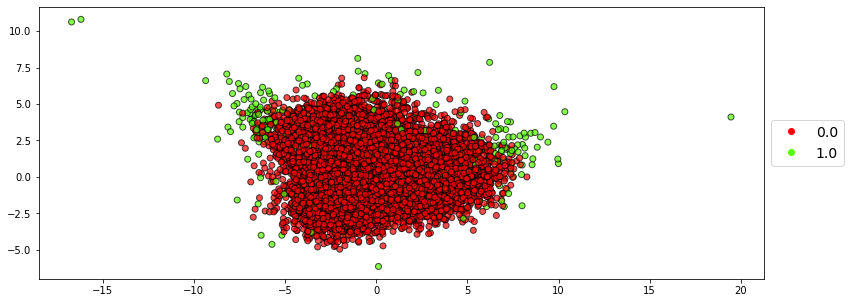

In [142]:
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=label, cmap=plt.cm.prism, edgecolor='k', alpha=0.7)
labels = np.unique(label)
handles = [plt.Line2D([],[],marker="o", ls="", 
                      color=scatter.cmap(scatter.norm(yi))) for yi in labels]
plt.legend(handles, labels,loc='center left', prop=dict(size=14),bbox_to_anchor=(1, 0.5))


## ABOD

In [52]:
clf = ABOD(contamination =0.01, n_neighbors =30, method="fast")
clf.fit(X)

ABOD(contamination=0.01, method='fast', n_neighbors=30)

In [53]:
clf.decision_scores_

array([-0.00063157, -0.00095092, -0.00104442, ..., -0.00105233,
       -0.00078964, -0.00128091])

In [54]:
outliers = clf.predict(X)
np.unique(outliers, return_counts=True)

(array([0, 1]), array([24752,   248], dtype=int64))

In [55]:
def condition(x): return x == 1
output = [idx for idx, element in enumerate(outliers) if condition(element)]

In [56]:
output

[160,
 182,
 229,
 371,
 489,
 493,
 781,
 1177,
 1374,
 1430,
 1433,
 1495,
 1496,
 1517,
 1520,
 1596,
 2421,
 2706,
 2792,
 2814,
 2817,
 2822,
 3074,
 3184,
 3186,
 3265,
 3301,
 3308,
 3319,
 3343,
 3402,
 3503,
 3802,
 3803,
 3943,
 4034,
 4141,
 4148,
 4203,
 4209,
 4428,
 4606,
 4704,
 4740,
 4741,
 4751,
 4776,
 4831,
 5016,
 5374,
 5434,
 5540,
 5591,
 5594,
 5896,
 5897,
 6182,
 6246,
 6299,
 6358,
 6400,
 6408,
 6514,
 6579,
 6597,
 6600,
 6778,
 6782,
 6803,
 6825,
 6910,
 6996,
 7010,
 7042,
 7209,
 7310,
 7377,
 7483,
 7540,
 7641,
 7660,
 7962,
 8138,
 8305,
 8449,
 8591,
 8605,
 8608,
 8724,
 8910,
 8911,
 9107,
 9114,
 9116,
 9119,
 9285,
 9294,
 9797,
 9987,
 10116,
 10126,
 10437,
 10607,
 10675,
 10745,
 11130,
 11425,
 11459,
 12153,
 12351,
 12353,
 12512,
 12651,
 12660,
 12682,
 12749,
 12750,
 12751,
 12752,
 12924,
 13082,
 13146,
 13266,
 13267,
 13269,
 13326,
 13384,
 13398,
 13549,
 13696,
 13699,
 13812,
 13975,
 14061,
 14170,
 14234,
 14435,
 14448,
 1

In [57]:
df['abod']=0

In [58]:
df['c']=0

In [59]:
df

feature    chroma_stft      mfcc                                          \
statistics        mean       max                                           
number              01        01        03        04        07        11   
track_id                                                                   
2             1.864015  0.615044 -0.818777  0.213081 -0.096828 -0.476763   
3            -0.103482  0.624062 -0.015655  1.446340  1.204416 -0.573946   
5             0.148445 -0.247580 -0.886495  0.540787 -0.723140 -0.529327   
10           -0.594383  0.509512 -0.554957 -0.688499 -1.283151 -0.764907   
134          -0.195610 -0.262829 -0.611942  1.035116 -0.125502  0.375753   
...                ...       ...       ...       ...       ...       ...   
155297       -0.430592  0.305315  0.561155 -1.791943 -0.908838 -1.243676   
155298       -0.187850 -0.650332  0.125382  0.985945 -0.700850  0.569318   
155306       -0.743733  0.160118  0.356916  0.681264 -0.714185  1.418310   
155307       -0.835230  0.084341 -0.495278 -0.159603  0.156442  0.103322   
155314        0.713116  0.066684 -1.468946 -0.086022 -0.989351  0.172696   

feature                                             ...            \
statistics      mean       min                      ...       std   
number            02        02        04        05  ...        04   
track_id                                            ...             
2          -0.902046  0.469769 -0.305931 -2.115932  ...  0.148286   
3          -0.793508 -0.160231  1.279239 -1.553918  ...  0.358945   
5          -0.415501 -1.649346  0.801040 -0.880009  ...  0.743308   
10          0.362832  0.469769 -0.265699  0.621925  ... -0.983444   
134        -0.625369  0.437693 -1.880751 -0.548531  ...  2.841332   
...              ...       ...       ...       ...  ...       ...   
155297      0.579622  0.469769  0.601930  1.504507  ... -1.310667   
155298      0.479782  0.469769  1.491871 -0.629697  ... -0.214119   
155306      1.007887  0.469769 -0.219917 -0.712982  ...  1.472445   
155307     -0.665914  0.269297 -0.264420 -2.180229  ...  0.375342   
155314      0.665470  0.461383 -0.452329  0.084216  ...  0.416651   

feature    spectral_bandwidth spectral_contrast                       tonnetz  \
statistics           kurtosis               max                 min       std   
number                     01                03        04        02        01   
track_id                                                                        
2                   -0.114547         -0.721109 -0.921316 -0.630913 -1.322089   
3                   -0.173787         -0.148690 -0.929216 -1.948937 -0.466338   
5                   -0.232903         -0.785605 -0.485505 -0.617137 -0.567065   
10                  -0.251092          0.517845 -1.477813  1.067838 -1.111215   
134                 -0.253663         -0.273997 -0.780149 -1.453616 -0.736969   
...                       ...               ...       ...       ...       ...   
155297               0.554218         -0.438450 -0.915637  0.932068  1.608608   
155298              -0.035324         -0.661214  0.299440  1.663762  1.132566   
155306              -0.094618         -0.457176 -0.169755 -0.299824  1.320804   
155307              -0.283712          1.191542  0.009926 -0.490732  0.709097   
155314              -0.268042         -0.695283 -0.907888 -0.201529 -0.329836   

feature         metadata isol_Forest abod  c  
statistics         track                      
number         genre_top                      
track_id                                      
2                Hip-Hop         0.0    0  0  
3                Hip-Hop         0.0    0  0  
5                Hip-Hop         0.0    0  0  
10                   Pop         0.0    0  0  
134              Hip-Hop         0.0    0  0  
...                  ...         ...  ... ..  
155297      Instrumental         0.0    0  0  
155298              Folk         0.0    0  0  
155306              Folk         0.0    0  

In [60]:
for i in output:
    df.iat[i,22]=1
    df.iat[i,23]=1

    print(i)

160
182
229
371
489
493
781
1177
1374
1430
1433
1495
1496
1517
1520
1596
2421
2706
2792
2814
2817
2822
3074
3184
3186
3265
3301
3308
3319
3343
3402
3503
3802
3803
3943
4034
4141
4148
4203
4209
4428
4606
4704
4740
4741
4751
4776
4831
5016
5374
5434
5540
5591
5594
5896
5897
6182
6246
6299
6358
6400
6408
6514
6579
6597
6600
6778
6782
6803
6825
6910
6996
7010
7042
7209
7310
7377
7483
7540
7641
7660
7962
8138
8305
8449
8591
8605
8608
8724
8910
8911
9107
9114
9116
9119
9285
9294
9797
9987
10116
10126
10437
10607
10675
10745
11130
11425
11459
12153
12351
12353
12512
12651
12660
12682
12749
12750
12751
12752
12924
13082
13146
13266
13267
13269
13326
13384
13398
13549
13696
13699
13812
13975
14061
14170
14234
14435
14448
14703
14762
14763
14818
14820
14963
14965
15049
15050
15051
15169
15195
15232
15382
15454
15455
15458
15566
15601
15713
15870
16089
16126
16200
16239
16641
16643
17022
17135
17139
17462
17528
17585
17596
17603
17616
17626
17738
17743
18117
18415
18932
19266
19313
19314
19320
19

In [61]:
pca = PCA(n_components=2)
pca.fit(X)
X_pca = pca.transform(X)

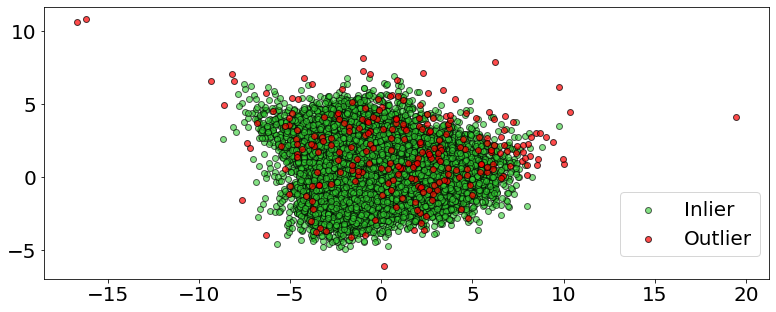

In [70]:
plt.scatter(X_pca[df['abod']==0][:,0],X_pca[df['abod']==0][:,1],c='limegreen',label='Inlier',alpha=0.6,edgecolor='k')
plt.scatter(X_pca[df['abod']==1][:,0],X_pca[df['abod']==1][:,1],c='red',label='Outlier',alpha=0.7,edgecolor='k')

plt.legend(loc='center left', prop=dict(size=20),bbox_to_anchor=(0.78, 0.2))
plt.show()

In [109]:
bbb=df['abod'].copy()

In [110]:
label = bbb

In [111]:
lab=df['c']

In [112]:
lab

track_id
2         0
3         0
5         0
10        0
134       0
         ..
155297    0
155298    0
155306    0
155307    0
155314    0
Name: c, Length: 25000, dtype: int64

In [90]:
label

track_id
2         Inlier
3         Inlier
5         Inlier
10        Inlier
134       Inlier
           ...  
155297    Inlier
155298    Inlier
155306    Inlier
155307    Inlier
155314    Inlier
Name: abod, Length: 25000, dtype: object

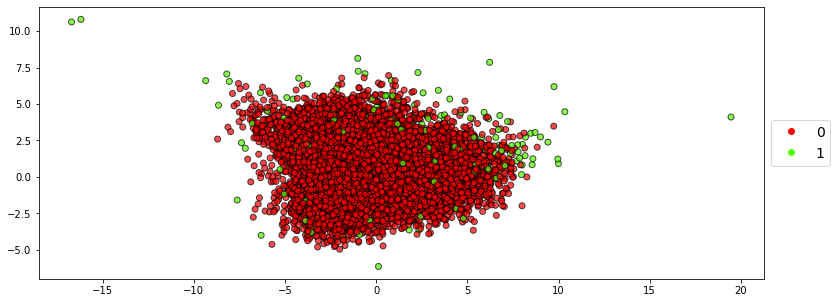

In [113]:
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=label, cmap=plt.cm.prism, edgecolor='k', alpha=0.7)
labels = np.unique(label)
handles = [plt.Line2D([],[],marker="o", ls="", 
                      color=scatter.cmap(scatter.norm(yi))) for yi in labels]
plt.legend(handles, labels,loc='center left', prop=dict(size=14),bbox_to_anchor=(1, 0.5))

In [133]:
df_outliers=df.iloc[output]

In [134]:
df_outliers['metadata','track','genre_top'].value_counts()

Experimental           98
Electronic             76
Instrumental           27
Rock                   18
Old-Time / Historic     8
International           5
Hip-Hop                 4
Pop                     4
Folk                    3
Jazz                    2
Spoken                  2
Classical               1
Name: (metadata, track, genre_top), dtype: int64

In [135]:
df['metadata','track','genre_top'].value_counts()

Rock                   7103
Electronic             6314
Experimental           2251
Hip-Hop                2201
Folk                   1519
Instrumental           1350
Pop                    1186
International          1018
Classical               619
Old-Time / Historic     510
Jazz                    384
Country                 178
Soul-RnB                154
Spoken                  118
Blues                    74
Easy Listening           21
Name: (metadata, track, genre_top), dtype: int64

In [148]:
df=features.drop(features.index[[output]])

C:\Users\Federico\anaconda3\lib\site-packages\pandas\core\indexes\base.py:3941: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



In [149]:
df

feature    chroma_stft       mfcc                                    \
statistics        mean        max                                     
number              01         01         03          04         07   
track_id                                                              
2             0.696063  28.657707  52.424423  103.289833  37.843021   
3             0.449602  29.380682  76.742714  137.245010  55.662521   
5             0.481160 -40.500740  50.373932  112.312531  29.266182   
10            0.388109  20.196968  60.412815   78.466721  21.597277   
134           0.438062 -41.723225  58.687328  125.922821  37.450359   
...                ...        ...        ...         ...        ...   
155297        0.408626   3.826046  94.208336   48.085751  26.723190   
155298        0.439034 -72.790154  81.013275  124.569000  29.571426   
155306        0.369401  -7.814734  88.024063  116.180260  29.388819   
155307        0.357939 -13.889938  62.219879   93.028778  41.311356   
155314        0.551894 -15.305521  32.737503   95.054657  25.620636   

feature                                                                ...  \
statistics                   mean           min                        ...   
number             11          02            02         04         05  ...   
track_id                                                               ...   
2           27.737400  116.696678 -1.421085e-14 -51.569004 -97.879890  ...   
3           26.740063  120.158501 -1.851665e+01 -12.548506 -87.048355  ...   
5           27.197964  132.215073 -6.228398e+01 -24.319845 -74.060310  ...   
10          24.780317  157.040085  5.151435e-14 -50.578659 -45.113949  ...   
134         36.486378  125.521309 -9.427860e-01 -90.334747 -67.671829  ...   
...               ...         ...           ...        ...        ...  ...   
155297      19.866936  163.954620 -1.776357e-14 -29.221125 -28.104187  ...   
155298      38.472843  160.770218 -7.993606e-14  -7.314378 -69.236115  ...   
155306      47.185654  177.614151  5.329071e-15 -49.451691 -70.841232  ...   
155307      33.690544  124.228142 -5.892177e+00 -50.547176 -99.119080  ...   
155314      34.402496  166.692734 -2.464827e-01 -55.172737 -55.477066  ...   

feature                          spectral_bandwidth spectral_contrast  \
statistics        std                      kurtosis               max   
number             02         04                 01                03   
track_id                                                                
2           38.569584  20.767921           3.874384         39.333603   
3           41.191982  22.025253           2.383340         42.141411   
5           39.367599  24.319347           0.895442         39.017235   
10          44.409843  14.013119           0.437628         45.410881   
134         47.266518  36.841534           0.372903         41.526760   
...               ...        ...                ...               ...   
155297      30.287067  12.060067          20.706787         40.720093   
155298      39.359367  18.604885           5.868375         39.627396   
155306      40.537926  28.671246           4.375974         40.628235   
155307      35.382370  22.123117          -0.383395         48.715477   
155314      26.786989  22.369673           0.011010         39.460281   

feature                           tonnetz metadata                              
statistics                  min       std      set         track                
number             04        02        01   subset     genre_top genre_top_Cat  
track_id                                                                        
2           31.513493  2.296826  0.019809    small       Hip-Hop             7  
3           31.473713  0.652681  0.026316   medium       Hip-Hop             7  
5           33.707951  2.314010  0.025550    small       Hip-Hop             7  
10          28.711344  4.415900  0.021413    small           Pop            12  
134         32.2243

In [150]:
df['metadata','track','genre_top'].value_counts()

Rock                   7085
Electronic             6238
Hip-Hop                2197
Experimental           2153
Folk                   1516
Instrumental           1323
Pop                    1182
International          1013
Classical               618
Old-Time / Historic     502
Jazz                    382
Country                 178
Soul-RnB                154
Spoken                  116
Blues                    74
Easy Listening           21
Name: (metadata, track, genre_top), dtype: int64

In [151]:
df.to_csv('data/fma_metadata/df_senzaOutliers.csv', index = True)


## QUESTO SOPRA E' IL CSV SU CUI CONTINUEREMO LE ANALISI, CI ABBIAMO TOLTO GLI OUTLIERS

## PCA

In [7]:
pca = PCA(n_components=2)
pca.fit(X)
X_pca = pca.transform(X)

In [8]:
label = features[('metadata','track','genre_top_Cat')]


In [9]:
X_pca

array([[ 0.97958725, -2.08194928],
       [ 2.06196349, -1.64840148],
       [ 0.72288314, -1.1784413 ],
       ...,
       [ 0.95344763,  0.56713266],
       [ 0.78563821,  0.45978702],
       [-1.31530917, -1.58291694]])

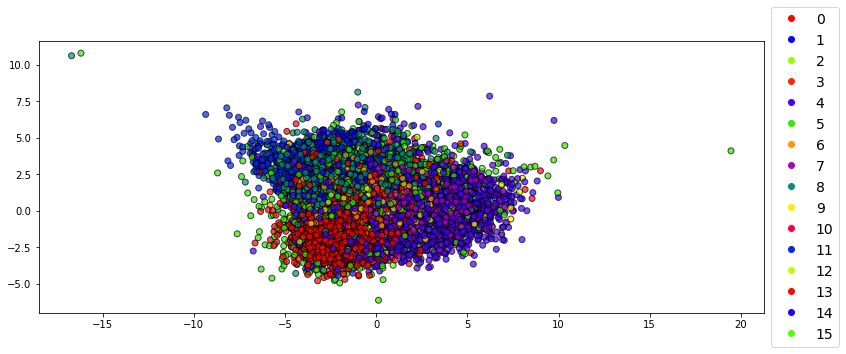

In [10]:
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=label, cmap=plt.cm.prism, edgecolor='k', alpha=0.7)
labels = np.unique(label)
handles = [plt.Line2D([],[],marker="o", ls="", 
                      color=scatter.cmap(scatter.norm(yi))) for yi in labels]
plt.legend(handles, labels,loc='center left', prop=dict(size=14),bbox_to_anchor=(1, 0.5))


In [11]:
features['metadata','track'].drop_duplicates()

C:\Users\Federico\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:2866: PerformanceWarning: indexing past lexsort depth may impact performance.
  result = self._run_cell(


number,genre_top,genre_top_Cat
track_id,,
2,Hip-Hop,7
10,Pop,12
136,Rock,13
139,Folk,6
148,Experimental,5
237,Jazz,10
397,Electronic,4
666,International,9
734,Soul-RnB,14


In [12]:
pca = PCA(n_components=3)
pca.fit(X)
X_pca = pca.transform(X)

In [13]:
X_pca

array([[ 0.97957793, -2.0821007 ,  1.54388776],
       [ 2.06196225, -1.64870301,  0.09975612],
       [ 0.72288269, -1.17874356,  0.9886879 ],
       ...,
       [ 0.95344235,  0.56707751, -1.20283739],
       [ 0.78563174,  0.45942236,  1.06640499],
       [-1.3153119 , -1.58310555,  1.50245042]])

In [14]:
label = features[('metadata','track','genre_top_Cat')]
aaa=y
aaa=aaa.reset_index()
aaa

,track_id,metadata
,,track
,,genre_top
0,2,Hip-Hop
1,3,Hip-Hop
2,5,Hip-Hop
3,10,Pop
4,134,Hip-Hop
...,...,...
24995,155297,Instrumental
24996,155298,Folk


In [15]:
columns = ["A", "B", "C"]

dfprova1 = pd.DataFrame(data=X_pca, columns=columns)
dfprova1['y']=aaa[('metadata','track','genre_top')]
dfprova1

,A,B,C,y
0,0.979578,-2.082101,1.543888,Hip-Hop
1,2.061962,-1.648703,0.099756,Hip-Hop
2,0.722883,-1.178744,0.988688,Hip-Hop
3,-1.593134,-0.612658,0.386115,Pop
4,2.296521,-0.409564,1.374630,Hip-Hop
...,...,...,...,...
24995,-2.944761,0.482215,-2.048469,Instrumental
24996,-0.439588,0.585367,-1.569377,Folk
24997,0.953442,0.567078,-1.202837,Folk
24998,0.785632,0.459422,1.066405,Experimental


In [16]:

import plotly.graph_objects as go

PLOT = go.Figure()

for c in list(np.unique(y)):
    
    PLOT.add_trace(go.Scatter3d(x = dfprova1[dfprova1.y == c]['A'],
                                y = dfprova1[dfprova1.y == c]['B'],
                                z = dfprova1[dfprova1.y == c]['C'],
                                mode = 'markers', marker_size = 6, marker_line_width = 1,
                                name = str(c)))
    
    PLOT.update_layout(width = 950, height = 600, autosize = True, showlegend = True,
                   scene = dict(xaxis=dict(title = 'A', titlefont_color = 'black'),
                                yaxis=dict(title = 'B', titlefont_color = 'black'),
                                zaxis=dict(title = 'C', titlefont_color = 'black')),
                   font = dict(family = "Gilroy", color  = 'black', size = 15))
PLOT.show()

In [17]:
dfprova1['y'].value_counts()

Rock                   7103
Electronic             6314
Experimental           2251
Hip-Hop                2201
Folk                   1519
Instrumental           1350
Pop                    1186
International          1018
Classical               619
Old-Time / Historic     510
Jazz                    384
Country                 178
Soul-RnB                154
Spoken                  118
Blues                    74
Easy Listening           21
Name: y, dtype: int64

In [18]:
import plotly.graph_objects as go

PLOT = go.Figure()

for c in list(np.unique(y)):
    
    PLOT.add_trace(go.Scatter3d(x = dfprova1[dfprova1.y == c]['A'],
                                y = dfprova1[dfprova1.y == c]['B'],
                                z = dfprova1[dfprova1.y == c]['C'],
                                mode = 'markers', marker_size = 6, marker_line_width = 1,
                                name = str(c)))
    
    PLOT.update_layout(width = 950, height = 600, autosize = True, showlegend = True,
                   scene = dict(xaxis=dict(title = 'A', titlefont_color = 'black'),
                                yaxis=dict(title = 'B', titlefont_color = 'black'),
                                zaxis=dict(title = 'C', titlefont_color = 'black')),
                   font = dict(family = "Gilroy", color  = 'black', size = 15))
PLOT.show()